# A Dive Into the Efficiency of Recipes

**Name(s)**: Jacob Lee

**Website Link**: https://jjinppang02.github.io/recipes_analysis/

In [1]:
import pandas as pd
import numpy as np
from pathlib import Path

import plotly.express as px
pd.options.plotting.backend = 'plotly'

# from dsc80_utils import * # Feel free to uncomment and use this.

## Step 1: Introduction

In [2]:
#Are higher ratings given to recipes with higher efficiency?

## Step 2: Data Cleaning and Exploratory Data Analysis

In [3]:
# Load the CSV file into a DataFrame
recipes = pd.read_csv("RAW_recipes.csv")
ratings = pd.read_csv("interactions.csv")

 
df = recipes.merge(ratings, left_on='id', right_on='recipe_id', how='left')

df_clean = df.replace(r'^\s*$', np.nan, regex=True)

df_clean = df_clean.dropna()

df_clean = df_clean[df_clean['rating'] != 0]

df_clean = df_clean[df_clean['n_ingredients'] != 0]

df_clean = df_clean[df_clean['n_steps'] != 0]

df_clean = df_clean[df_clean['minutes'] != 0]

avg_ratings = df_clean.groupby('id')['rating'].mean()

df_clean = df_clean.merge(avg_ratings.rename('avg_rating'), on='id', how='left')

df_clean['efficiency'] = df_clean['n_steps'] / df_clean['minutes']

df_clean = df_clean.dropna()




In [4]:
df_clean

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,user_id,recipe_id,date,rating,review,avg_rating,efficiency
0,1 brownies in the world best ever,333281,40,985201,2008-10-27,"['60-minutes-or-less', 'time-to-make', 'course...","[138.4, 10.0, 50.0, 3.0, 3.0, 19.0, 6.0]",10,['heat the oven to 350f and arrange the rack i...,"these are the most; chocolatey, moist, rich, d...","['bittersweet chocolate', 'unsalted butter', '...",9,386585.0,333281.0,2008-11-19,4.0,"These were pretty good, but took forever to ba...",4.0,0.250000
1,1 in canada chocolate chip cookies,453467,45,1848091,2011-04-11,"['60-minutes-or-less', 'time-to-make', 'cuisin...","[595.1, 46.0, 211.0, 22.0, 13.0, 51.0, 26.0]",12,"['pre-heat oven the 350 degrees f', 'in a mixi...",this is the recipe that we use at my school ca...,"['white sugar', 'brown sugar', 'salt', 'margar...",11,424680.0,453467.0,2012-01-26,5.0,Originally I was gonna cut the recipe in half ...,5.0,0.266667
2,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,29782.0,306168.0,2008-12-31,5.0,This was one of the best broccoli casseroles t...,5.0,0.150000
3,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,1196280.0,306168.0,2009-04-13,5.0,I made this for my son's first birthday party ...,5.0,0.150000
4,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,768828.0,306168.0,2013-08-02,5.0,Loved this. Be sure to completely thaw the br...,5.0,0.150000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219223,zydeco ya ya deviled eggs,308080,40,37779,2008-06-07,"['60-minutes-or-less', 'time-to-make', 'course...","[59.2, 6.0, 2.0, 3.0, 6.0, 5.0, 0.0]",7,"['in a bowl , combine the mashed yolks and may...","deviled eggs, cajun-style","['hard-cooked eggs', 'mayonnaise', 'dijon must...",8,226863.0,308080.0,2009-10-11,5.0,"I halved the recipe, and they turned out great...",5.0,0.175000
219224,zydeco ya ya deviled eggs,308080,40,37779,2008-06-07,"['60-minutes-or-less', 'time-to-make', 'course...","[59.2, 6.0, 2.0, 3.0, 6.0, 5.0, 0.0]",7,"['in a bowl , combine the mashed yolks and may...","deviled eggs, cajun-style","['hard-cooked eggs', 'mayonnaise', 'dijon must...",8,844554.0,308080.0,2009-10-14,5.0,These were very good. I meant to add some jala...,5.0,0.175000
219225,cookies by design cookies on a stick,298512,29,506822,2008-04-15,"['30-minutes-or-less', 'time-to-make', 'course...","[188.0, 11.0, 57.0, 11.0, 7.0, 21.0, 9.0]",9,['place melted butter in a large mixing bowl a...,"i've heard of the 'cookies by design' company,...","['butter', 'eagle brand condensed milk', 'ligh...",10,804234.0,298512.0,2008-05-02,1.0,I would rate this a zero if I could. I followe...,1.0,0.310345
219226,cookies by design sugar shortbread cookies,298509,20,506822,2008-04-15,"['30-minutes-or-less', 'time-to-make', 'course...","[174.9, 14.0, 33.0, 4.0, 4.0, 11.0, 6.0]",5,"['whip sugar and shortening in a large bowl , ...","i've heard of the 'cookies by design' company,...","['granulated sugar', 'shortening', 'eggs', 'fl...",7,866651.0,298509.0,2008-06-19,1.0,This recipe tastes nothing like the Cookies by...,3.0,0.250000


In [5]:
df_clean.head()

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,user_id,recipe_id,date,rating,review,avg_rating,efficiency
0,1 brownies in the world best ever,333281,40,985201,2008-10-27,"['60-minutes-or-less', 'time-to-make', 'course...","[138.4, 10.0, 50.0, 3.0, 3.0, 19.0, 6.0]",10,['heat the oven to 350f and arrange the rack i...,"these are the most; chocolatey, moist, rich, d...","['bittersweet chocolate', 'unsalted butter', '...",9,386585.0,333281.0,2008-11-19,4.0,"These were pretty good, but took forever to ba...",4.0,0.250000
1,1 in canada chocolate chip cookies,453467,45,1848091,2011-04-11,"['60-minutes-or-less', 'time-to-make', 'cuisin...","[595.1, 46.0, 211.0, 22.0, 13.0, 51.0, 26.0]",12,"['pre-heat oven the 350 degrees f', 'in a mixi...",this is the recipe that we use at my school ca...,"['white sugar', 'brown sugar', 'salt', 'margar...",11,424680.0,453467.0,2012-01-26,5.0,Originally I was gonna cut the recipe in half ...,5.0,0.266667
2,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,29782.0,306168.0,2008-12-31,5.0,This was one of the best broccoli casseroles t...,5.0,0.150000
3,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,1196280.0,306168.0,2009-04-13,5.0,I made this for my son's first birthday party ...,5.0,0.150000
4,412 broccoli casserole,306168,40,50969,2008-05-30,"['60-minutes-or-less', 'time-to-make', 'course...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"['preheat oven to 350 degrees', 'spray a 2 qua...",since there are already 411 recipes for brocco...,"['frozen broccoli cuts', 'cream of chicken sou...",9,768828.0,306168.0,2013-08-02,5.0,Loved this. Be sure to completely thaw the br...,5.0,0.150000


Recipes analysed: 216,892
Correlation (efficiency vs rating): 0.0203

Rating by efficiency quartile:
efficiency_quartile
Q1 (Slow)    4.6490
Q2           4.6754
Q3           4.6971
Q4 (Fast)    4.6985
Name: rating, dtype: float64


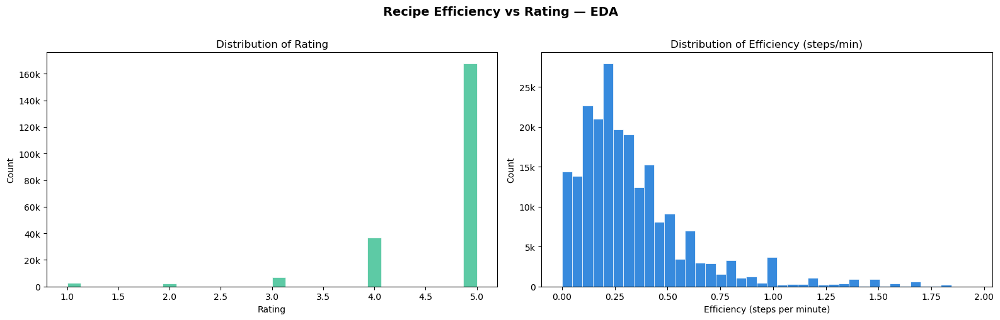

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

df = df_clean.copy()
df = df[df['efficiency'] < df['efficiency'].quantile(0.99)]

# Bin efficiency into quartiles for group comparison
df['efficiency_quartile'] = pd.qcut(
    df['efficiency'], q=4, labels=['Q1 (Slow)', 'Q2', 'Q3', 'Q4 (Fast)']
)

# --- Descriptive stats ---
print(f"Recipes analysed: {len(df):,}")
print(f"Correlation (efficiency vs rating): {df['efficiency'].corr(df['rating']):.4f}")
print("\nRating by efficiency quartile:")
print(df.groupby('efficiency_quartile', observed=True)['rating'].mean().round(4))

# --- Plots ---
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Recipe Efficiency vs Rating — EDA', fontsize=14, fontweight='bold', y=1.01)

# Plot 1: Distribution of avg_rating
axes[0].hist(df['rating'], bins=30, color='#5DCAA5', edgecolor='white', linewidth=0.5)
axes[0].set_title('Distribution of Rating', fontsize=12)
axes[0].set_xlabel('Rating')
axes[0].set_ylabel('Count')
axes[0].yaxis.set_major_formatter(
    mticker.FuncFormatter(lambda x, _: f'{int(x/1000)}k' if x >= 1000 else str(int(x)))
)

# Plot 2: Distribution of efficiency
axes[1].hist(df['efficiency'], bins=40, color='#378ADD', edgecolor='white', linewidth=0.5)
axes[1].set_title('Distribution of Efficiency (steps/min)', fontsize=12)
axes[1].set_xlabel('Efficiency (steps per minute)')
axes[1].set_ylabel('Count')
axes[1].yaxis.set_major_formatter(
    mticker.FuncFormatter(lambda x, _: f'{int(x/1000)}k' if x >= 1000 else str(int(x)))
)

plt.tight_layout()
plt.savefig('efficiency_eda.png', dpi=150, bbox_inches='tight')
plt.show()


In [ ]:
#Make Usable for the README file

import plotly.graph_objects as go
from plotly.subplots import make_subplots

df = df_clean.copy()
df = df[df['efficiency'] < df['efficiency'].quantile(0.99)]

fig = make_subplots(rows=1, cols=2, subplot_titles=(
    'Distribution of Rating', 'Distribution of Efficiency (steps/min)'
))

fig.add_trace(go.Histogram(x=df['rating'], nbinsx=30, marker_color='#5DCAA5',
    marker_line_color='white', marker_line_width=0.5, name='Rating'), row=1, col=1)

fig.add_trace(go.Histogram(x=df['efficiency'], nbinsx=40, marker_color='#378ADD',
    marker_line_color='white', marker_line_width=0.5, name='Efficiency'), row=1, col=2)

fig.update_layout(title_text='Recipe Efficiency vs Rating', title_font_size=15, showlegend=False, bargap=0.05)
fig.update_xaxes(title_text='Rating', row=1, col=1)
fig.update_xaxes(title_text='Efficiency (steps per minute)', row=1, col=2)
fig.update_yaxes(title_text='Count', row=1, col=1)
fig.update_yaxes(title_text='Count', row=1, col=2)

fig.write_html('assets/distribution_plots.html', include_plotlyjs='cdn')
fig.show()

C:\Users\jacob\AppData\Local\Temp\ipykernel_29652\2785859723.py:13: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



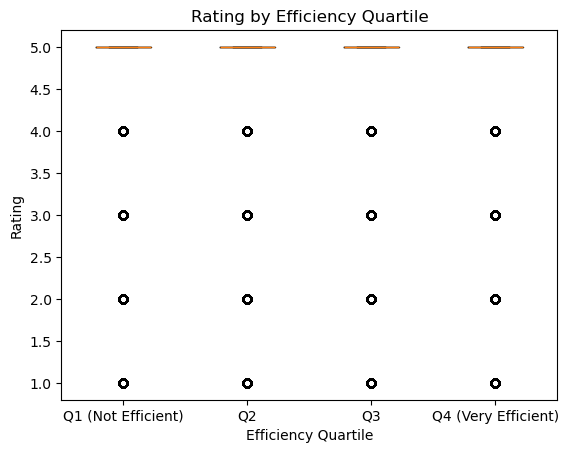

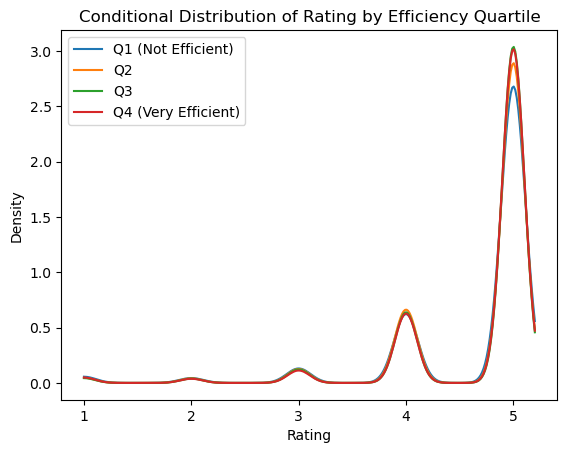

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

df['efficiency_quartile'] = pd.qcut(
    df['efficiency'], q=4, labels=['Q1 (Not Efficient)', 'Q2', 'Q3', 'Q4 (Very Efficient)']
)

quartiles = ['Q1 (Not Efficient)', 'Q2', 'Q3', 'Q4 (Very Efficient)']

data_by_q = [df[df['efficiency_quartile'] == q]['rating'].values for q in quartiles]
plt.boxplot(data_by_q, labels=quartiles)
plt.title('Rating by Efficiency Quartile')
plt.xlabel('Efficiency Quartile')
plt.ylabel('Rating')
plt.show()

x_grid = np.linspace(1, 5.2, 300)
for q in quartiles:
    vals = df[df['efficiency_quartile'] == q]['rating'].values
    kde = gaussian_kde(vals, bw_method=0.15)
    plt.plot(x_grid, kde(x_grid), label=q)
plt.title('Conditional Distribution of Rating by Efficiency Quartile')
plt.xlabel('Rating')
plt.ylabel('Density')
plt.legend()
plt.show()

In [ ]:
#Make Usable for the README file

import numpy as np
from scipy.stats import gaussian_kde
import plotly.graph_objects as go

# Assume df has columns: 'rating' and 'efficiency_quartile'
x_grid = np.linspace(1, 5.2, 300)
fig = go.Figure()

for q in quartiles:
    vals = df[df['efficiency_quartile'] == q]['rating'].values
    kde = gaussian_kde(vals, bw_method=0.15)
    fig.add_trace(go.Scatter(
        x=x_grid,
        y=kde(x_grid),
        mode='lines',
        name=q
    ))

fig.update_layout(
    title="Conditional Distribution of Rating by Efficiency Quartile",
    xaxis_title="Rating",
    yaxis_title="Density",
    font=dict(family="Arial", size=12, color="#333"),
    plot_bgcolor="white",
    paper_bgcolor="white",
    margin=dict(t=60, b=50, l=50, r=30),
    legend_title_text="Efficiency Quartile"
)

fig.update_xaxes(showgrid=False, linecolor="#ccc", ticks="outside")
fig.update_yaxes(gridcolor="#eee", linecolor="#ccc")


fig.write_html('assets/cond_distribution_plots.html', include_plotlyjs='cdn')
fig.show()


In [10]:
import pandas as pd
import numpy as np


df = df_clean.copy()

# Bin columns for grouping
df['efficiency_quartile'] = pd.qcut(
    df['efficiency'], q=4, labels=['Q1 (Not Efficient)', 'Q2', 'Q3', 'Q4 (Very Efficient)']
)
df['rating_group'] = pd.cut(
    df['rating'],
    bins=[0, 3, 4, 4.5, 5.001],
    labels=['Low (<3)', 'Mid (3-4)', 'High (4-4.5)', 'Very High (>4.5)']
)

# --- Pivot 1: Mean stats per efficiency quartile ---
# Shows how recipe characteristics (cook time, steps, rating) differ across efficiency groups
pivot_by_quartile = df.pivot_table(
    index='efficiency_quartile',
    values=['rating', 'efficiency', 'n_steps', 'minutes', 'n_ingredients'],
    aggfunc='mean'
).round(3)

print("=== Mean stats by efficiency quartile ===")
print(pivot_by_quartile)
print()

# --- Pivot 2: Count of recipes per rating group × efficiency quartile ---
# Cross-tab showing how recipes distribute across both dimensions
pivot_counts = df.pivot_table(
    index='rating_group',
    columns='efficiency_quartile',
    values='rating',
    aggfunc='count',
    observed=True
)

print("=== Recipe counts: rating group × efficiency quartile ===")
print(pivot_counts)
print()

# Row-normalised proportions: within each rating group, what share falls in each efficiency quartile?
pivot_props = pivot_counts.div(pivot_counts.sum(axis=1), axis=0).round(3)
print("=== Row proportions (within each rating group) ===")
print(pivot_props)
print()

# --- Groupby 3: Mean efficiency and cook time per rating group ---
# Directly checks: do higher-rated recipes tend to be more efficient?
print("=== Mean efficiency & cook time by rating group ===")
print(df.groupby('rating_group', observed=True)[['efficiency', 'n_steps', 'minutes', 'n_ingredients']].mean().round(3))


=== Mean stats by efficiency quartile ===
                     efficiency  minutes  n_ingredients  n_steps  rating
efficiency_quartile                                                     
Q1 (Not Efficient)        0.085  316.819          9.295    8.301   4.649
Q2                        0.211   46.409          9.430    9.573   4.675
Q3                        0.345   31.943          9.339   10.811   4.697
Q4 (Very Efficient)       0.819   17.432          8.166   11.102   4.699

=== Recipe counts: rating group × efficiency quartile ===
efficiency_quartile  Q1 (Not Efficient)     Q2     Q3  Q4 (Very Efficient)
rating_group                                                              
Low (<3)                           3580   3246   2790                 2782
Mid (3-4)                          9681  10078   8649                 8867
Very High (>4.5)                  41657  44005  41290                42603

=== Row proportions (within each rating group) ===
efficiency_quartile  Q1 (Not Effic

C:\Users\jacob\AppData\Local\Temp\ipykernel_29652\1706260203.py:19: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



## Step 3: Assessment of Missingness

In [11]:
import pandas as pd
import numpy as np
from scipy.stats import gaussian_kde
import plotly.graph_objects as go

# --- Data loading and merging ---
recipes = pd.read_csv("RAW_recipes.csv")
ratings = pd.read_csv("interactions.csv")

merged = recipes.merge(ratings, left_on='id', right_on='recipe_id', how='left')
merged['rating'] = merged['rating'].replace(0, np.nan)
merged['rating_missing'] = merged['rating'].isna()

# --- Helper: permutation test ---
def permutation_test(df, col, n_permutations=500):
    observed_stat = abs(
        df.groupby('rating_missing')[col].mean()[True] -
        df.groupby('rating_missing')[col].mean()[False]
    )
    simulated_stats = []
    for _ in range(n_permutations):
        shuffled = df['rating_missing'].sample(frac=1, replace=False).reset_index(drop=True)
        temp = df[[col]].copy()
        temp['rating_missing'] = shuffled.values
        stat = abs(temp.groupby('rating_missing')[col].mean()[True] -
                   temp.groupby('rating_missing')[col].mean()[False])
        simulated_stats.append(stat)
    simulated_stats = np.array(simulated_stats)
    p_value = (simulated_stats >= observed_stat).mean()
    return observed_stat, simulated_stats, p_value


# -------------------------------------------------------
# Test 1: missingness of rating vs n_steps
# -------------------------------------------------------
obs_steps, sims_steps, p_steps = permutation_test(merged, 'n_steps')
print(f"n_steps | observed stat: {obs_steps:.4f} | p-value: {p_steps:.4f}")

# Plot 1a — Distribution of n_steps by missingness
fig1 = go.Figure()
fig1.add_histogram(x=merged[merged['rating_missing']==False]['n_steps'],
                   name="Rating not missing", opacity=0.6, histnorm="density")
fig1.add_histogram(x=merged[merged['rating_missing']==True]['n_steps'],
                   name="Rating missing", opacity=0.6, histnorm="density")

fig1.update_layout(
    title="Distribution of n_steps by rating missingness",
    xaxis_title="n_steps",
    yaxis_title="Density",
    barmode="overlay"
)
fig1.write_html("assets/plot_nsteps_distribution.html", include_plotlyjs="cdn")
fig1.show()

# Plot 1b — Permutation test histogram
fig2 = go.Figure()
fig2.add_histogram(x=sims_steps, nbinsx=30, name="Simulated stats")
fig2.add_vline(x=obs_steps, line_color="green",
               annotation_text=f"Observed = {obs_steps:.3f}",
               annotation_position="top right")

fig2.update_layout(
    title=f"Permutation test: n_steps vs rating missingness (p = {p_steps:.3f})",
    xaxis_title="Absolute difference in mean n_steps",
    yaxis_title="Count"
)
fig2.write_html("assets/plot_nsteps_permutation.html", include_plotlyjs="cdn")
fig2.show()


# -------------------------------------------------------
# Test 2: missingness of rating vs minutes
# -------------------------------------------------------
obs_mins, sims_mins, p_mins = permutation_test(merged, 'minutes')
print(f"minutes | observed stat: {obs_mins:.4f} | p-value: {p_mins:.4f}")

cap = 300
mins_not_missing = merged[merged['rating_missing']==False]['minutes'].clip(upper=cap)
mins_missing = merged[merged['rating_missing']==True]['minutes'].clip(upper=cap)

# Plot 2a — Distribution of minutes by missingness
fig3 = go.Figure()
fig3.add_histogram(x=mins_not_missing, name="Rating not missing",
                   opacity=0.6, histnorm="density")
fig3.add_histogram(x=mins_missing, name="Rating missing",
                   opacity=0.6, histnorm="density")

fig3.update_layout(
    title="Distribution of minutes by rating missingness (capped at 300)",
    xaxis_title="Minutes",
    yaxis_title="Density",
    barmode="overlay"
)
fig3.write_html("assets/plot_minutes_distribution.html", include_plotlyjs="cdn")
fig3.show()


# Plot 2b — Permutation test histogram
fig4 = go.Figure()
fig4.add_histogram(x=sims_mins, nbinsx=30, name="Simulated stats")
fig4.add_vline(x=obs_mins, line_color="green",
               annotation_text=f"Observed = {obs_mins:.3f}",
               annotation_position="top right")

fig4.update_layout(
    title=f"Permutation test: minutes vs rating missingness (p = {p_mins:.3f})",
    xaxis_title="Absolute difference in mean minutes",
    yaxis_title="Count"
)
fig4.write_html("assets/plot_minutes_permutation.html", include_plotlyjs="cdn")
fig4.show()



n_steps | observed stat: 1.3386 | p-value: 0.0000


minutes | observed stat: 51.4524 | p-value: 0.1280


## Step 4: Hypothesis Testing

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = df_clean.copy()
df['efficiency_quartile'] = pd.qcut(df['efficiency'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
df['high_rated'] = (df['rating'] >= 4.5).astype(int)

# --- Hypotheses ---
# Null hypothesis:      The proportion of recipes rated >= 4.5 is the same for
#                       the slowest (Q1) and fastest (Q4) efficiency groups.
#                       Any observed difference is due to random chance.
#
# Alternative hypothesis: The proportion of recipes rated >= 4.5 is higher for
#                         the fastest efficiency group (Q4) than the slowest (Q1).

# --- Observed statistic ---
q1 = df[df['efficiency_quartile'] == 'Q1']['high_rated'].values
q4 = df[df['efficiency_quartile'] == 'Q4']['high_rated'].values

obs_stat = q4.mean() - q1.mean()
print(f"Q1 proportion rated >= 4.5: {q1.mean():.4f}  (n={len(q1):,})")
print(f"Q4 proportion rated >= 4.5: {q4.mean():.4f}  (n={len(q4):,})")
print(f"Observed difference (Q4 - Q1): {obs_stat:.4f}")

# --- Permutation test ---
np.random.seed(42)
n_permutations = 1000
combined = np.concatenate([q1, q4])
n1 = len(q1)

simulated_stats = []
for _ in range(n_permutations):
    shuffled = np.random.permutation(combined)
    sim_stat = shuffled[n1:].mean() - shuffled[:n1].mean()
    simulated_stats.append(sim_stat)

simulated_stats = np.array(simulated_stats)
p_value = (np.abs(simulated_stats) >= np.abs(obs_stat)).mean()

print(f"\np-value: {p_value:.4f}")
if p_value < 0.05:
    print("Result: reject the null hypothesis (p < 0.05).")
    print("The proportion of high-rated recipes is significantly different between Q1 and Q4.")
else:
    print("Result: fail to reject the null hypothesis (p >= 0.05).")

# --- Plot: permutation distribution ---
fig = go.Figure()

fig.add_histogram(
    x=simulated_stats,
    nbinsx=30,
    name="Simulated stats",
    opacity=0.75
)

fig.add_vline(
    x=obs_stat,
    line_color="green",
    line_width=3,
    annotation_text=f"Observed = {obs_stat:.4f}",
    annotation_position="top right"
)

fig.add_vline(
    x=-obs_stat,
    line_color="green",
    line_width=2,
    line_dash="dash"
)

fig.update_layout(
    title=f"Permutation Test: Proportion Rated >= 4.5 (Q1 vs Q4)<br>p-value = {p_value:.4f}",
    xaxis_title="Simulated difference in proportions (Q4 - Q1)",
    yaxis_title="Count",
    bargap=0.05,
    plot_bgcolor="white",
    paper_bgcolor="white"
)

# --- Export to HTML ---
fig.write_html("assets/permutation_test_q1_q4.html", include_plotlyjs="cdn")

fig.show()

Q1 proportion rated >= 4.5: 0.7585  (n=54,918)
Q4 proportion rated >= 4.5: 0.7853  (n=54,252)
Observed difference (Q4 - Q1): 0.0267

p-value: 0.0000
Result: reject the null hypothesis (p < 0.05).
The proportion of high-rated recipes is significantly different between Q1 and Q4.


## Step 5: Framing a Prediction Problem

In [13]:
#Predicting the number of minutes a recipe actually takes

## Step 6: Baseline Model

In [14]:
import ast
import numpy as np
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler


# --- Target: minutes (cap at 99th percentile to remove extreme outliers) ---
cap = recipes['minutes'].quantile(0.99)
df = recipes[(recipes['minutes'] <= cap) & (recipes['minutes'] > 0)].copy()

# --- Feature engineering: extract binary flags from the tags column ---
# tags is stored as a string representation of a Python list, e.g. "['60-minutes-or-less', ...]"
# We extract four time-related tags as binary (0/1) categorical features.
time_tags = [
    '15-minutes-or-less',
    '30-minutes-or-less',
    '60-minutes-or-less',
    '4-hours-or-less',
]

def extract_tag(tags_str, tag):
    try:
        return int(tag in ast.literal_eval(tags_str))
    except Exception:
        return 0

for tag in time_tags:
    col = 'tag_' + tag.replace('-', '_')
    df[col] = df['tags'].apply(lambda x, t=tag: extract_tag(x, t))

# --- Features and target ---
# Numerical: n_steps, n_ingredients (both scaled)
# Categorical (binary encoded from tags): tag_15_minutes_or_less,
#   tag_30_minutes_or_less, tag_60_minutes_or_less, tag_4_hours_or_less
numerical_cols = ['n_steps', 'n_ingredients']
tag_cols = ['tag_' + t.replace('-', '_') for t in time_tags]
feature_cols = numerical_cols + tag_cols

X = df[feature_cols]
y = df['minutes']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# --- Pipeline ---
# ColumnTransformer: scale numerical features, pass binary tag features through as-is
preprocessor = ColumnTransformer(transformers=[
    ('scale_numerical', StandardScaler(), numerical_cols),
    ('passthrough_tags', FunctionTransformer(), tag_cols),   # already 0/1, no scaling needed
])

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model',        LinearRegression()),
])

pipeline.fit(X_train, y_train)

# --- Evaluation ---
preds = pipeline.predict(X_test)
mae      = mean_absolute_error(y_test, preds)

print(f"{'Metric':<30} {'Value':>10}")
print("-" * 42)
print(f"{'MAE':<30} {mae:>10.3f}")


Metric                              Value
------------------------------------------
MAE                                15.138


## Step 7: Final Model

In [22]:
import ast
import numpy as np
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, QuantileTransformer, StandardScaler

# -----------------------------------------------------------------------
# Data loading and merging (same as baseline)
# -----------------------------------------------------------------------
recipes = df_clean

cap = recipes['minutes'].quantile(0.99)
df = recipes[(recipes['minutes'] <= cap) & (recipes['minutes'] > 0)].copy()

# -----------------------------------------------------------------------
# Feature engineering
# -----------------------------------------------------------------------

# 1. Parse nutrition column (stored as a stringified list) into separate columns.
#    We use `calories` and `total_fat` as new features — richer recipes with
#    more calories tend to involve longer cooking processes (e.g. roasts, stews).
def parse_nutrition(s):
    try:
        vals = ast.literal_eval(s)
        return pd.Series(
            vals, index=['calories', 'total_fat', 'sugar', 'sodium', 'protein', 'sat_fat', 'carbs']
        )
    except Exception:
        return pd.Series([np.nan] * 7, index=['calories', 'total_fat', 'sugar', 'sodium', 'protein', 'sat_fat', 'carbs'])

nutrition = df['nutrition'].apply(parse_nutrition)
df = pd.concat([df, nutrition], axis=1)

# 2. Extract binary time-related tag features (same as baseline).
time_tags = ['15-minutes-or-less', '30-minutes-or-less', '60-minutes-or-less', '4-hours-or-less']

def extract_tag(tags_str, tag):
    try:
        return int(tag in ast.literal_eval(tags_str))
    except Exception:
        return 0

for tag in time_tags:
    df['tag_' + tag.replace('-', '_')] = df['tags'].apply(lambda x, t=tag: extract_tag(x, t))

# 3. NEW FEATURE: n_steps_sq — squared number of steps.
#    The relationship between steps and cook time is non-linear: adding step 15
#    to a 14-step recipe adds much more time than adding step 2 to a 1-step recipe.
#    Squaring captures this accelerating effect.
df['n_steps_sq'] = df['n_steps'] ** 2

# 4. NEW FEATURE: steps_per_ingredient — ratio of steps to ingredients.
#    A recipe with many steps but few ingredients (e.g. a soufflé) implies
#    time-intensive technique. A recipe with many ingredients but few steps
#    (e.g. a salad) is quick. This ratio captures recipe complexity independent
#    of raw step or ingredient count.
df['steps_per_ingredient'] = df['n_steps'] / df['n_ingredients'].replace(0, np.nan)

df = df.dropna(subset=['n_steps', 'n_ingredients', 'calories', 'steps_per_ingredient'])

# -----------------------------------------------------------------------
# Feature columns
# -----------------------------------------------------------------------
numerical_cols  = ['n_steps', 'n_ingredients']          # standardised
tag_cols        = ['tag_' + t.replace('-', '_') for t in time_tags]  # passthrough (already 0/1)
quantile_cols   = ['calories', 'total_fat']              # QuantileTransformer (heavy right skew)
new_feature_cols = ['n_steps_sq', 'steps_per_ingredient']  # standardised

feature_cols = numerical_cols + tag_cols + quantile_cols + new_feature_cols

X = df[feature_cols]
y = df['minutes']

# IMPORTANT: use the same random_state=42 split as the baseline so results are comparable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# -----------------------------------------------------------------------
# Pipeline
# -----------------------------------------------------------------------
# Preprocessing rationale:
#   - StandardScaler on n_steps, n_ingredients, n_steps_sq, steps_per_ingredient:
#     keeps tree splits numerically stable and comparable.
#   - QuantileTransformer on calories and total_fat: both are heavily right-skewed
#     (a small number of very high-calorie recipes). Mapping to a normal distribution
#     prevents those outliers from dominating split decisions in the tree.
#   - FunctionTransformer (passthrough) on binary tag columns: already 0/1, no transform needed.

preprocessor = ColumnTransformer(transformers=[
    ('scale',       StandardScaler(),
     numerical_cols + new_feature_cols),
    ('quantile',    QuantileTransformer(n_quantiles=100, output_distribution='normal', random_state=42),
     quantile_cols),
    ('passthrough', FunctionTransformer(),
     tag_cols),
])

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model',        RandomForestRegressor(random_state=42, n_jobs=-1)),
])

# -----------------------------------------------------------------------
# Hyperparameter tuning with GridSearchCV
# -----------------------------------------------------------------------
# Hyperparameters to tune and why:
#   - max_depth: controls how deep each tree grows. Deeper trees can overfit;
#     shallower trees underfit. We try 10, 20, and None (fully grown).
#   - min_samples_split: minimum samples required to split a node. Higher values
#     act as regularisation, preventing the model from learning noise in small
#     leaf nodes. We try 2 (default, no regularisation) and 10 (more conservative).

param_grid = {
    'model__max_depth':         [10, 20, None],
    'model__min_samples_split': [2, 10],
}

grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=3,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    verbose=1,
)

grid_search.fit(X_train, y_train)

print(f"Best hyperparameters: {grid_search.best_params_}")

# -----------------------------------------------------------------------
# Final evaluation on held-out test set
# -----------------------------------------------------------------------
best_pipeline = grid_search.best_estimator_
preds = best_pipeline.predict(X_test)

mae  = mean_absolute_error(y_test, preds)

print(f"{'Metric':<30} {'Baseline':>10} {'Final':>10}")
print("-" * 52)
print(f"{'MAE':<30} {'15.138':>10} {mae:>10.3f}")


Fitting 3 folds for each of 6 candidates, totalling 18 fits
Best hyperparameters: {'model__max_depth': None, 'model__min_samples_split': 2}
Metric                           Baseline      Final
----------------------------------------------------
MAE                                15.138      4.645


## Step 8: Fairness Analysis

Group sizes   — simple: 24,690  |  complex: 18,722
RMSE (simple recipes):  27.593 min
RMSE (complex recipes): 28.625 min
Observed difference:    1.0322 min

p-value: 0.0680
Result: fail to reject the null hypothesis (p >= 0.05).


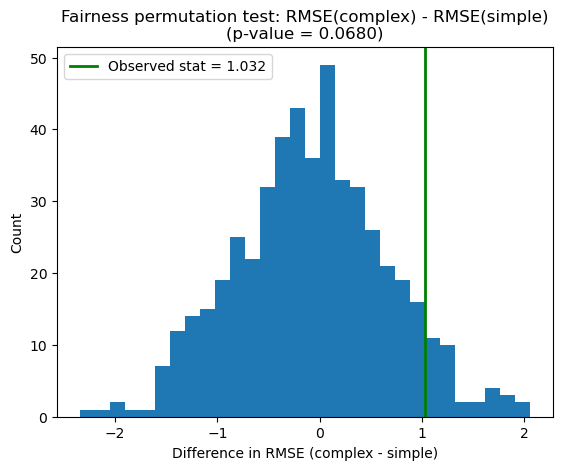

In [18]:
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, QuantileTransformer, StandardScaler

# -----------------------------------------------------------------------
# Data loading and merging (identical to final model)
# -----------------------------------------------------------------------
recipes = df_clean

cap = recipes['minutes'].quantile(0.99)
df = recipes[(recipes['minutes'] <= cap) & (recipes['minutes'] > 0)].copy()

def parse_nutrition(s):
    try:
        vals = ast.literal_eval(s)
        return pd.Series(vals, index=['calories','total_fat','sugar','sodium','protein','sat_fat','carbs'])
    except Exception:
        return pd.Series([np.nan]*7, index=['calories','total_fat','sugar','sodium','protein','sat_fat','carbs'])

nutrition = df['nutrition'].apply(parse_nutrition)
df = pd.concat([df, nutrition], axis=1)

time_tags = ['15-minutes-or-less','30-minutes-or-less','60-minutes-or-less','4-hours-or-less']
def extract_tag(tags_str, tag):
    try:
        return int(tag in ast.literal_eval(tags_str))
    except Exception:
        return 0
for tag in time_tags:
    df['tag_' + tag.replace('-', '_')] = df['tags'].apply(lambda x, t=tag: extract_tag(x, t))

df['n_steps_sq'] = df['n_steps'] ** 2
df['steps_per_ingredient'] = df['n_steps'] / df['n_ingredients'].replace(0, np.nan)
df = df.dropna(subset=['n_steps', 'n_ingredients', 'calories', 'steps_per_ingredient'])

# -----------------------------------------------------------------------
# Groups: simple vs. complex recipes
# -----------------------------------------------------------------------
# We binarize n_steps at the median (9 steps) to create two groups:
#   - Simple recipes:  n_steps <= 9
#   - Complex recipes: n_steps >  9
# This is an interesting fairness question because the model uses n_steps
# as a feature, and we want to know whether it performs equally well for
# recipes it has less structural signal for (complex, multi-step ones where
# cook time is harder to pin down).

median_steps = df['n_steps'].median()
df['is_complex'] = df['n_steps'] > median_steps

# -----------------------------------------------------------------------
# Train/test split — same random_state=42 as baseline and final model
# -----------------------------------------------------------------------
numerical_cols   = ['n_steps', 'n_ingredients']
tag_cols         = ['tag_' + t.replace('-', '_') for t in time_tags]
quantile_cols    = ['calories', 'total_fat']
new_feature_cols = ['n_steps_sq', 'steps_per_ingredient']
feature_cols     = numerical_cols + tag_cols + quantile_cols + new_feature_cols

X      = df[feature_cols]
y      = df['minutes']
groups = df['is_complex']

X_train, X_test, y_train, y_test, g_train, g_test = train_test_split(
    X, y, groups, test_size=0.2, random_state=42
)

# -----------------------------------------------------------------------
# Re-fit the final model (best hyperparameters from GridSearchCV)
# -----------------------------------------------------------------------
preprocessor = ColumnTransformer(transformers=[
    ('scale',       StandardScaler(),
     numerical_cols + new_feature_cols),
    ('quantile',    QuantileTransformer(n_quantiles=100, output_distribution='normal', random_state=42),
     quantile_cols),
    ('passthrough', FunctionTransformer(),
     tag_cols),
])

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', RandomForestRegressor(
        max_depth=10, min_samples_split=10, random_state=42, n_jobs=-1
    )),
])

pipeline.fit(X_train, y_train)
preds = pipeline.predict(X_test)

# -----------------------------------------------------------------------
# Observed test statistic: difference in RMSE (complex - simple)
# -----------------------------------------------------------------------
rmse_simple  = np.sqrt(mean_squared_error(y_test[~g_test], preds[~g_test]))
rmse_complex = np.sqrt(mean_squared_error(y_test[g_test],  preds[g_test]))
obs_stat     = rmse_complex - rmse_simple

print(f"Group sizes   — simple: {(~g_test).sum():,}  |  complex: {g_test.sum():,}")
print(f"RMSE (simple recipes):  {rmse_simple:.3f} min")
print(f"RMSE (complex recipes): {rmse_complex:.3f} min")
print(f"Observed difference:    {obs_stat:.4f} min")

# -----------------------------------------------------------------------
# Hypotheses
# -----------------------------------------------------------------------
# Null hypothesis:      The model is fair. Its RMSE for simple recipes and
#                       complex recipes are roughly the same, and any observed
#                       difference is due to random chance.
#
# Alternative hypothesis: The model is unfair. Its RMSE for complex recipes
#                         is higher than its RMSE for simple recipes.
#
# Test statistic: RMSE(complex) - RMSE(simple)  [one-sided test]
# Significance level: 0.05

# -----------------------------------------------------------------------
# Permutation test
# -----------------------------------------------------------------------
np.random.seed(42)
n_permutations = 500
simulated_stats = []

for _ in range(n_permutations):
    shuffled = g_test.sample(frac=1, replace=False).reset_index(drop=True).values
    r_simple  = np.sqrt(mean_squared_error(y_test.values[~shuffled], preds[~shuffled]))
    r_complex = np.sqrt(mean_squared_error(y_test.values[shuffled],  preds[shuffled]))
    simulated_stats.append(r_complex - r_simple)

simulated_stats = np.array(simulated_stats)
p_value = (simulated_stats >= obs_stat).mean()

print(f"\np-value: {p_value:.4f}")
if p_value < 0.05:
    print("Result: reject the null hypothesis (p < 0.05).")
    print("The model's RMSE is significantly higher for complex recipes than simple ones.")
else:
    print("Result: fail to reject the null hypothesis (p >= 0.05).")

# -----------------------------------------------------------------------
# Plot
# -----------------------------------------------------------------------
plt.hist(simulated_stats, bins=30)
plt.axvline(obs_stat, color='green', linewidth=2, label=f'Observed stat = {obs_stat:.3f}')
plt.title(f'Fairness permutation test: RMSE(complex) - RMSE(simple)\n(p-value = {p_value:.4f})')
plt.xlabel('Difference in RMSE (complex - simple)')
plt.ylabel('Count')
plt.legend()
plt.show()

In [ ]:
#Make Usable for the README file

import plotly.graph_objects as go

# Assume you already have: simulated_stats, obs_stat, p_value
fig = go.Figure()

# Histogram of permutation results
fig.add_histogram(
    x=simulated_stats,
    nbinsx=30,
    name="Simulated stats",
    opacity=0.75
)

# Observed statistic line
fig.add_vline(
    x=obs_stat,
    line_color="green",
    line_width=3,
    annotation_text=f"Observed stat = {obs_stat:.3f}",
    annotation_position="top right"
)

# Layout styling
fig.update_layout(
    title=f"Fairness permutation test: RMSE(complex) - RMSE(simple)<br>(p-value = {p_value:.4f})",
    xaxis_title="Difference in RMSE (complex - simple)",
    yaxis_title="Count",
    bargap=0.05,
    plot_bgcolor="white",
    paper_bgcolor="white",
    font=dict(family="Arial", size=12, color="#333")
)

# Export to HTML for README or Jekyll
fig.write_html("assets/fairness_permutation_test.html", include_plotlyjs="cdn")

fig.show()
